In [1]:
import SNIDsn
import SNIDdataset as snid
import numpy as np
import SNePCA

import plotly.plotly as ply
import plotly.graph_objs as go
import plotly.tools as tls

import matplotlib.pyplot as plt

from BinSpectra import random_noise_dataset
from BinSpectra import lowres_dataset
import warnings
from cycler import cycler
import random

PATH = '../Data/DataProducts/'

In [2]:
def loaddata(phase):
    dsname = "dataset{}.pickle".format(phase)
    return snid.loadPickle(PATH + dsname)

def replace_flux_with_noise(phase):
    """
    Replaces the flux in the input spectrum with random Gaussian noise.
    Parameters
    ----------
    phase : integer, phase of the dataset.
    
    Returns
    -------
    dataset with flux of each spectra replaced by random Gaussian noise.
    """
    datain = loaddata(phase)
    dataset_randn = random_noise_dataset(datain)
    return dataset_randn

def run_PCA_lowres(phase, b_len, dphase=5):
    """
    Runs PCA with lower resolutions of the spectrum.
    Parameters
    ----------
    phase : integer, phase of the dataset.
    b_len : the desired bining length of the output spectrum.
    
    Returns
    -------
    Principle components
    """
    warnings.filterwarnings('ignore')
    dataset = replace_flux_with_noise(phase)
    dataset_lowres = lowres_dataset(dataset, b_len)
    snidPCA = SNePCA.SNePCA(dataset_lowres, phase - dphase, phase + dphase)
    snidPCA.snidPCA()
    snidPCA.calcPCACoeffs()
    return snidPCA


def run_PCA_fullres(phase, dphase=5):
    """
    Runs PCA with full resolutions of the spectrum.
    Parameters
    ----------
    phase : integer, phase of the dataset.
        
    Returns
    -------
    Principle components
    """
    warnings.filterwarnings('ignore')
    dataset = replace_flux_with_noise(phase)
    snidPCA = SNePCA.SNePCA(dataset, phase - dphase, phase + dphase)
    snidPCA.snidPCA()
    snidPCA.calcPCACoeffs()
    return snidPCA

## Accuracy from binomial distribution

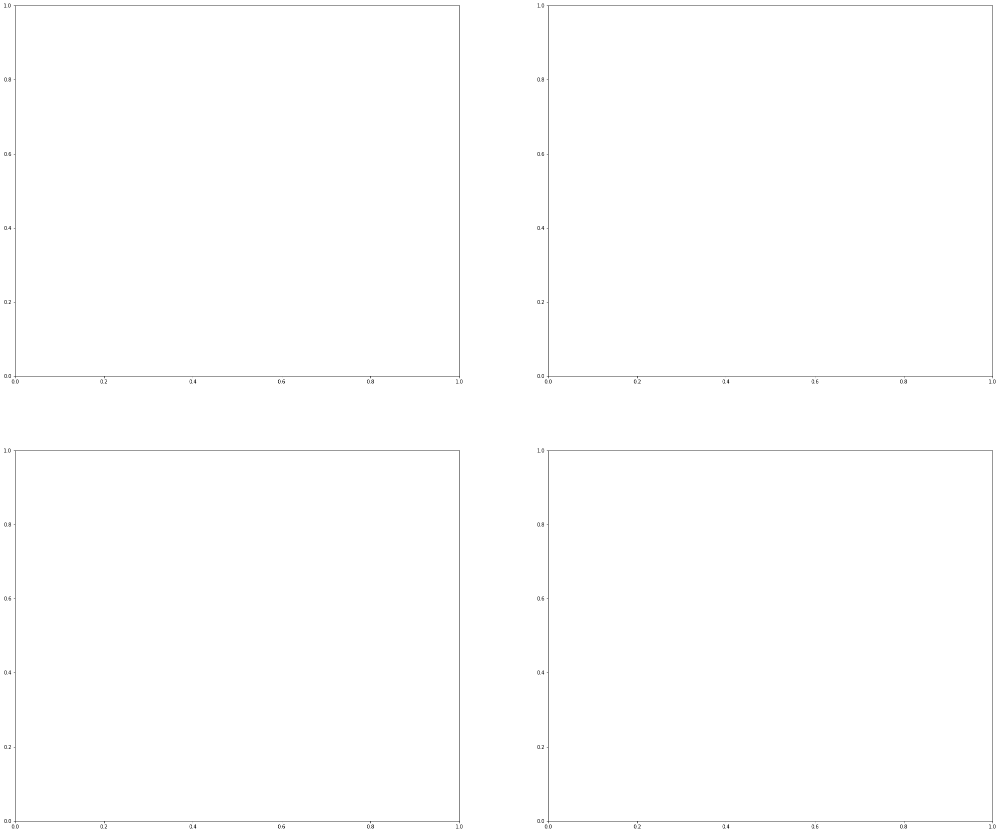

In [29]:
f_all, axs = plt.subplots(2,2,figsize=(35,30),gridspec_kw={'wspace':.2,'hspace':.2})

## SVM scores for low res random noise

In [10]:
k = 0.0027069686088658784
k_list =[]
while k <= 0.11098571296350102:
    k_list.append(k)
    k = k + 0.010827874435463514

0.3082352941176471


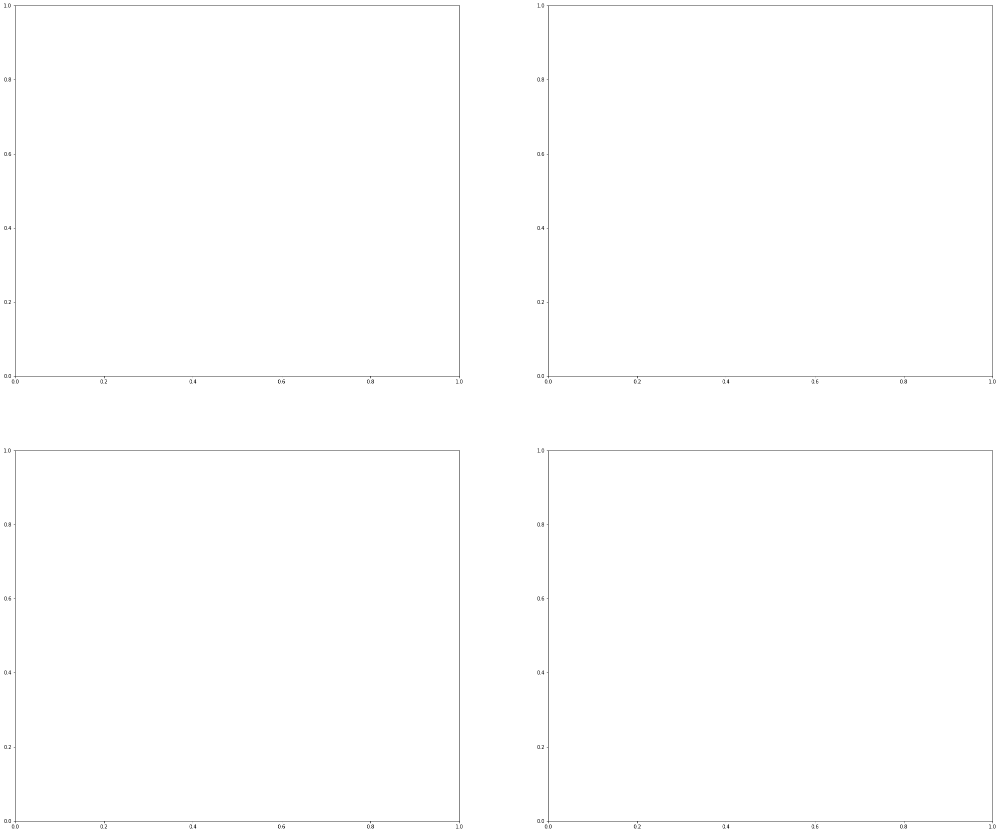

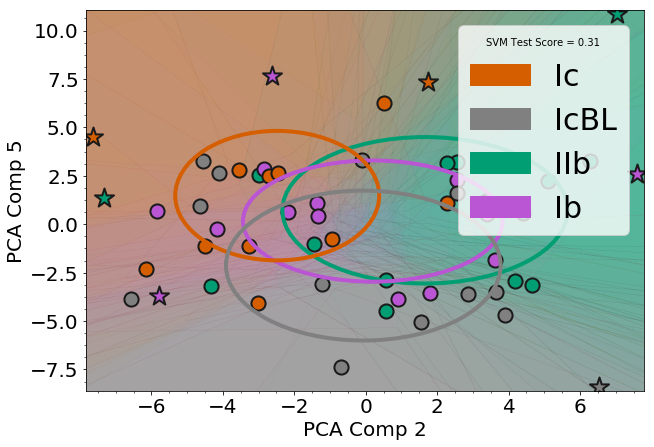

In [29]:
# Runs the SVM for binning length 0.0027 (binning factor 2)
b_len = k_list[0]
snidPCA = run_PCA_lowres(0, b_len, dphase=5)
exclude = ['sn2007uy', 'sn2009er', 'sn2005ek']
f_all, axs = plt.subplots(2,2,figsize=(35,30),gridspec_kw={'wspace':.2,'hspace':.2})
f_all,svmsc, av0, std0=snidPCA.pcaPlot(2,5,(10,7),alphamean=.5,alphaell=.1,alphasvm=10,
                                          purity=True,excludeSNe=exclude, std_rad=1.0, svm=True,
                                          count=3, fig=None, ax=None,ncv=50, markOutliers=True)
print(av0)

## SVM scores for full resolution random noise

### the maximum SVM score came out to be 0.35

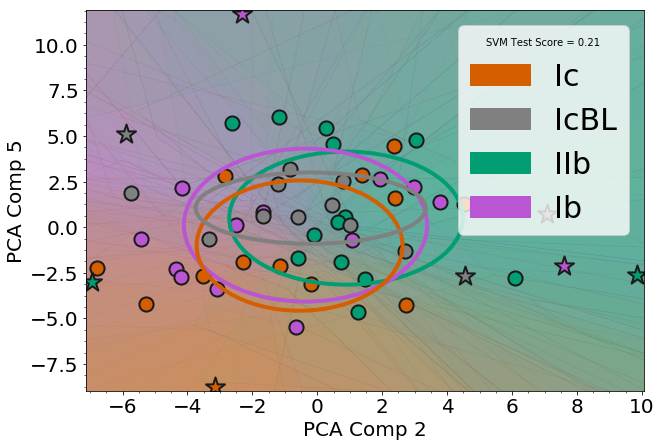

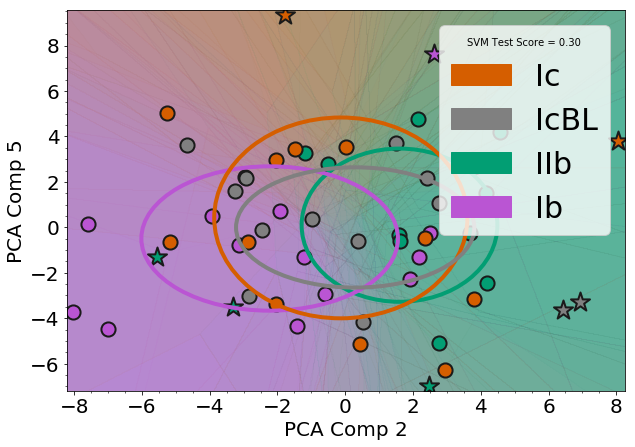

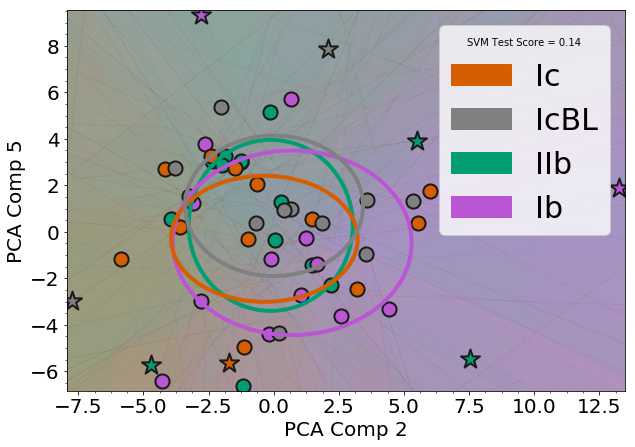

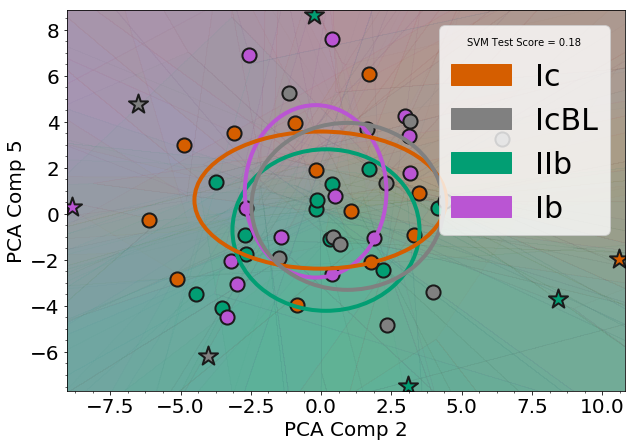

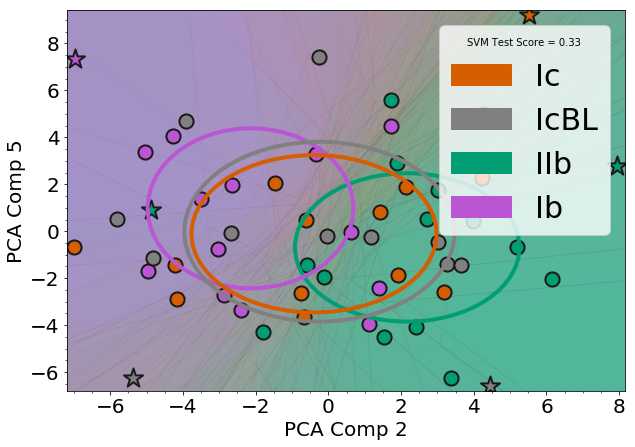

...

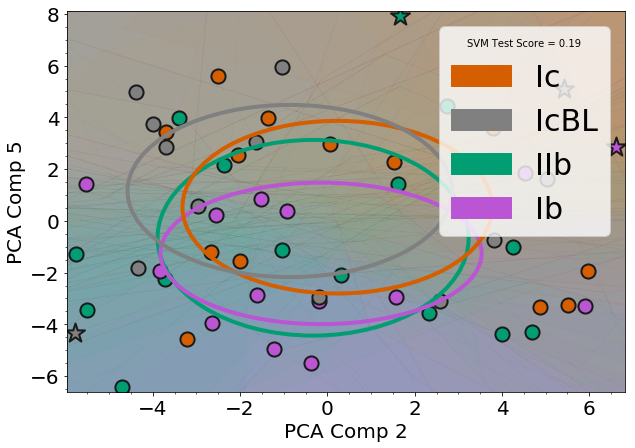

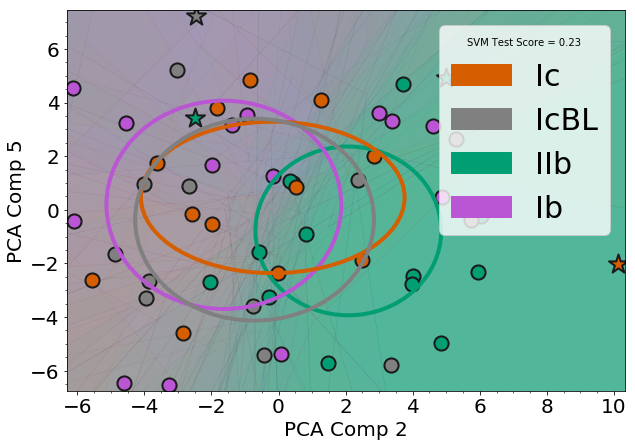

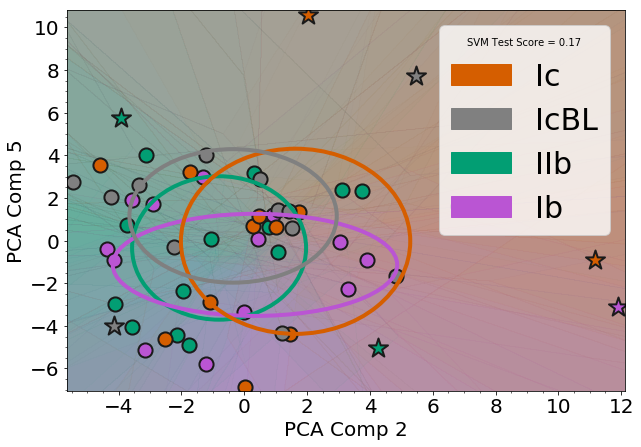

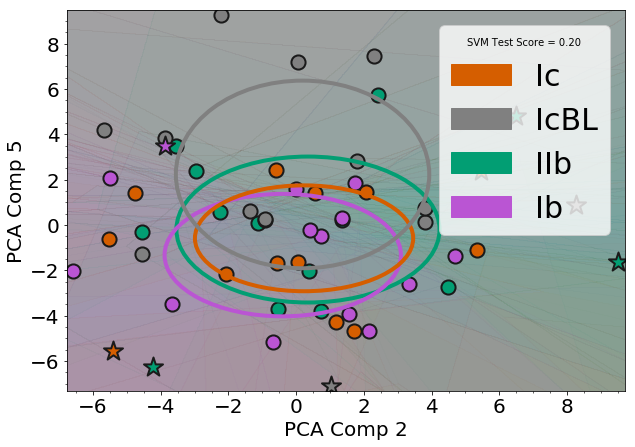

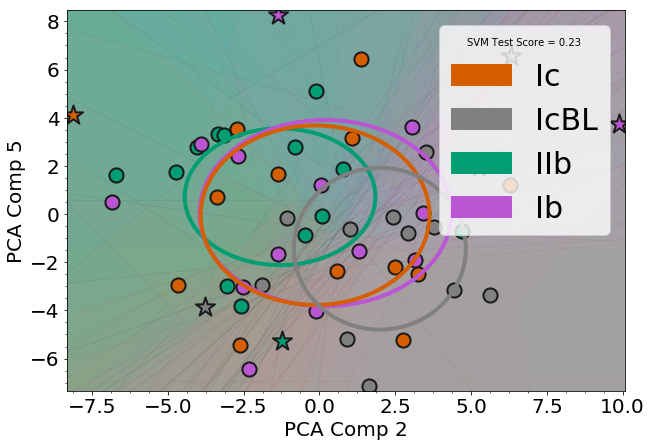

In [33]:
# I ran SVM for 50 times and for some runs, the SVM score is much greater than 0.25, which is really bad.
# This is for PC2 vs PC5.
av_svm_list = []
for i in range(50):
    snidPCA = run_PCA_fullres(0, dphase=5)
    exclude = ['sn2007uy', 'sn2009er', 'sn2005ek']
    f_all,svmsc, av0, std0=snidPCA.pcaPlot(2,5,(10,7),alphamean=.5,alphaell=.1,alphasvm=10,
                                          purity=True,excludeSNe=exclude, std_rad=1.0, svm=True,
                                          count=3, fig=None, ax=None,ncv=50, markOutliers=True)
    av_svm_list.append(av0)

In [34]:
sorted(j for j in av_svm_list if j >= 0.25)

[]

In [5]:
k = 0.0027069686088658784
k_list =[]
while k <= 0.11098571296350102:
    k_list.append(k)
    k = k + 0.010827874435463514

In [6]:
k_list

[0.0027069686088658784,
 0.013534843044329392,
 0.024362717479792906,
 0.03519059191525642,
 0.04601846635071993,
 0.05684634078618345,
 0.06767421522164696,
 0.07850208965711047,
 0.08932996409257399,
 0.1001578385280375,
 0.11098571296350102]